In [1]:
.libPaths("~/R/x86_64-pc-linux-gnu-library/4.4/")

library(Seurat)
library(SeuratDisk)
library(patchwork)
library(harmony)
library(reshape2)
library(RColorBrewer)
library(dplyr)
library(readr)
library(tidyverse)
library(Matrix)
library(Seurat)
library(ggplot2)
library(cowplot)
library(celldex)
library(SingleR)
library(data.table)
library(scGate)
library(ggpubr)
library(scCustomize)
library(GEOquery)

ggtheme <- function() {
  theme(
    axis.text = element_text(size = 20),
    axis.title = element_text(size = 20),
    text = element_text(size = 20, colour = "black"),
    legend.text = element_text(size = 20),
    legend.key.size =  unit(10, units = "points")
    
  )
}


Loading required package: SeuratObject

Loading required package: sp

‘SeuratObject’ was built under R 4.5.0 but the current version is
4.5.1; it is recomended that you reinstall ‘SeuratObject’ as the ABI
for R may have changed

‘SeuratObject’ was built with package ‘Matrix’ 1.7.3 but the current
version is 1.7.4; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Loading required package: Rcpp


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.2    

In [5]:
.libPaths("~/R/x86_64-pc-linux-gnu-library/4.2/")
library(SingleR)


Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats, rowProds, rowQuantiles, rowRanges

# Pathogenic vs non Pathogenic Th17

In [52]:
load("./data/pTh17_vs_npTh17_bulk/ref_th17_new.RData")

In [56]:
ref_th17_new$labels

[1] "npTh17_d1" "npTh17_d1" "npTh17_d1" "npTh17_d2" "npTh17_d2" "npTh17_d2"
 [7] "npTh17_d3" "npTh17_d3" "npTh17_d3" "pTh17_d1"  "pTh17_d1"  "pTh17_d1" 
[13] "pTh17_d2"  "pTh17_d2"  "pTh17_d3"  "pTh17_d3"  "pTh17_d3"

In [54]:
ref_th17_new$labels2  <-  sub("_.*", "", ref_th17_new$labels)

In [55]:
ref_th17_new$labels2

[1] "npTh17" "npTh17" "npTh17" "npTh17" "npTh17" "npTh17" "npTh17" "npTh17"
 [9] "npTh17" "pTh17"  "pTh17"  "pTh17"  "pTh17"  "pTh17"  "pTh17"  "pTh17" 
[17] "pTh17"

In [58]:
library(SingleR)
pred <- SingleR(test = gut_5p@assays$RNA3$counts, 
                ref=ref_th17_new$matrix, labels=ref_th17_new$labels2, 
                fine.tune = T,num.threads = 6)

In [61]:
gut_5p$Singler_Th17_v2  <- pred$labels

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



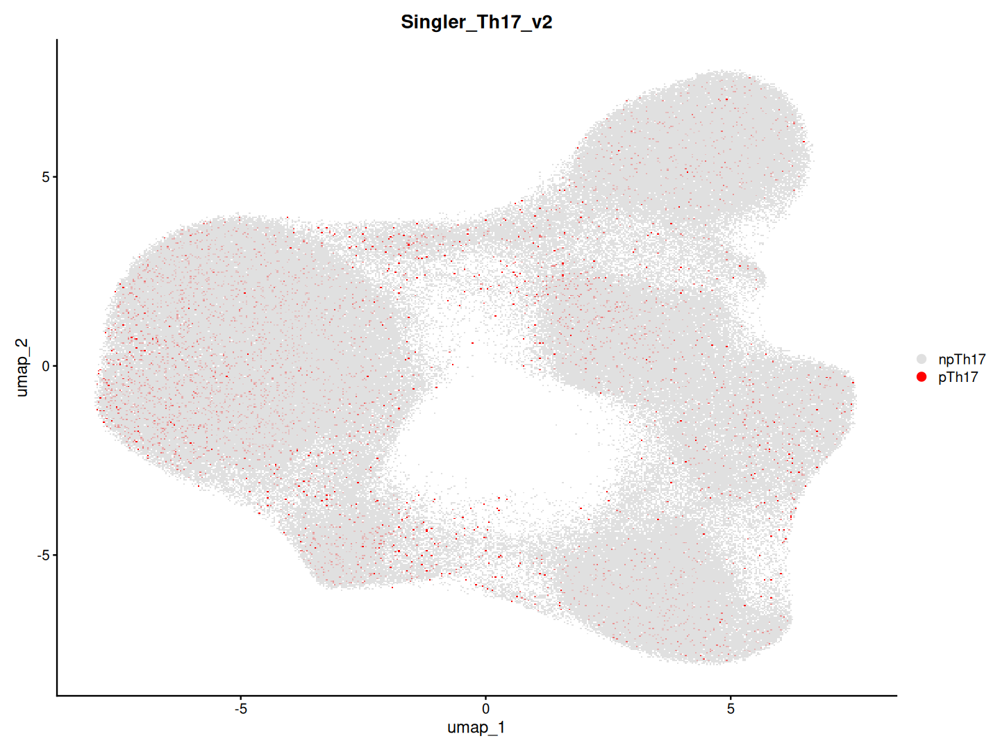

In [62]:
options(repr.plot.width = 12, repr.plot.height = 9)
DimPlot(gut_5p, group.by = "Singler_Th17_v2", reduction = "umap", cols = c("grey88", "red"))

In [ ]:
gut_5p$S  <- pred$labels

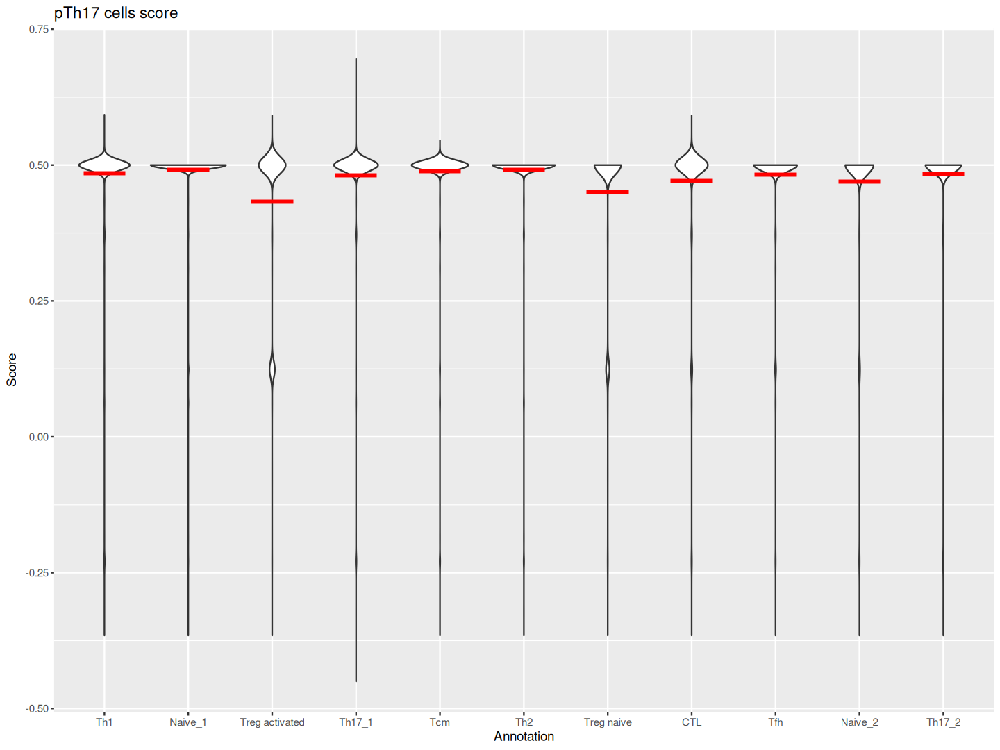

In [75]:
ggplot(data.frame(Score = pred2$scores[,1],
                  Annotation = gut_5p$annotations), aes(x = Annotation, y = Score)) +
  geom_violin() + 
  stat_summary(fun = "mean",
               geom = "crossbar", 
               width = 0.5,
               colour = "red") + ggtitle("pTh17 cells score")

In [66]:
library(SingleR)
pred2 <- SingleR(test = gut_5p@assays$RNA$counts, 
                ref=ref_th17_new$matrix, labels=ref_th17_new$labels, 
                fine.tune = T,num.threads = 6)

In [68]:
pred2$scores

npTh17_d1,npTh17_d2,npTh17_d3,pTh17_d1,pTh17_d2,pTh17_d3
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.3718183,0.32866221,0.31001539,0.37188538,0.3711537,0.30946070
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000


In [69]:
gut_5p$Singler_Th17_v3  <- pred2$labels

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



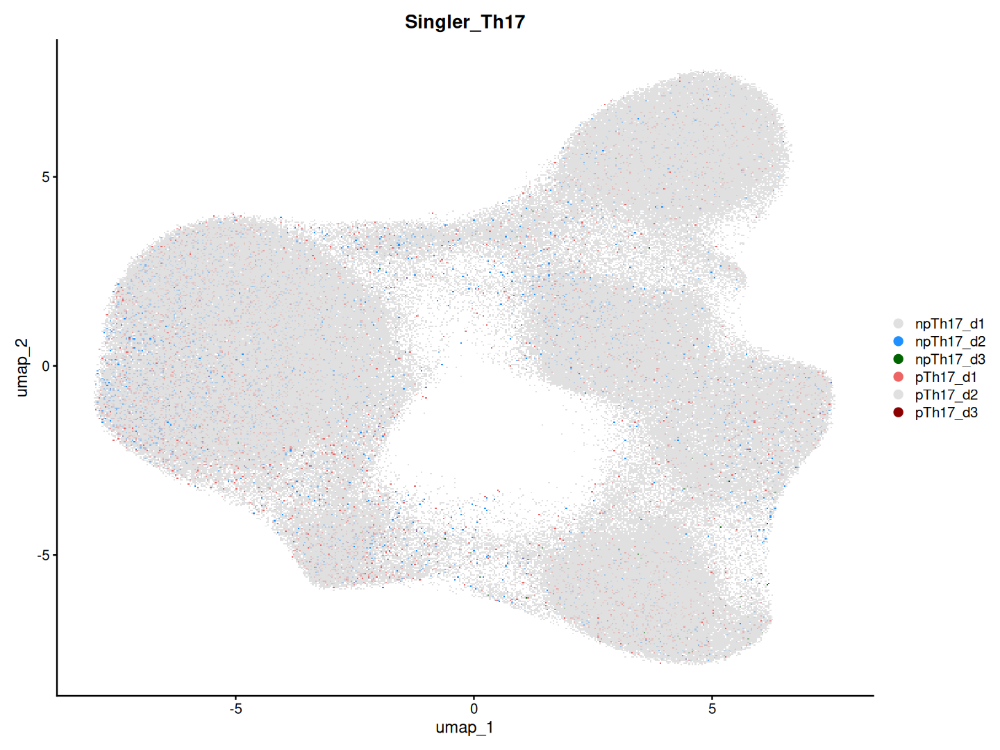

In [70]:
options(repr.plot.width = 12, repr.plot.height = 9)
DimPlot(gut_5p, group.by = "Singler_Th17", reduction = "umap", cols = c("grey88",
                                                                               "dodgerblue","darkgreen",
                                                                               "indianred2","grey88",
                                                                               "darkred"))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



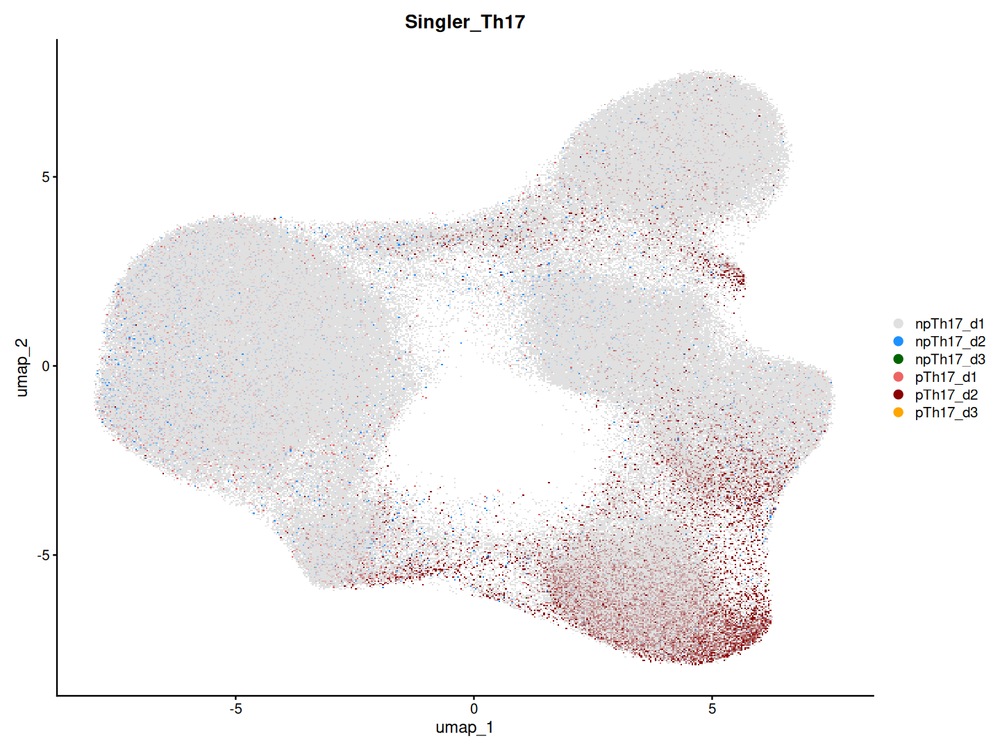

In [77]:
options(repr.plot.width = 12, repr.plot.height = 9)
DimPlot(gut_5p, group.by = "Singler_Th17", reduction = "umap", cols = c("grey88",
                                                                               "dodgerblue","darkgreen",
                                                                               "indianred2","darkred",
                                                                               "orange"))

In [79]:
pred2$scores

npTh17_d1,npTh17_d2,npTh17_d3,pTh17_d1,pTh17_d2,pTh17_d3
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000
0.3718183,0.32866221,0.31001539,0.37188538,0.3711537,0.30946070
0.5000000,0.50000000,0.50000000,0.50000000,0.5000000,0.50000000


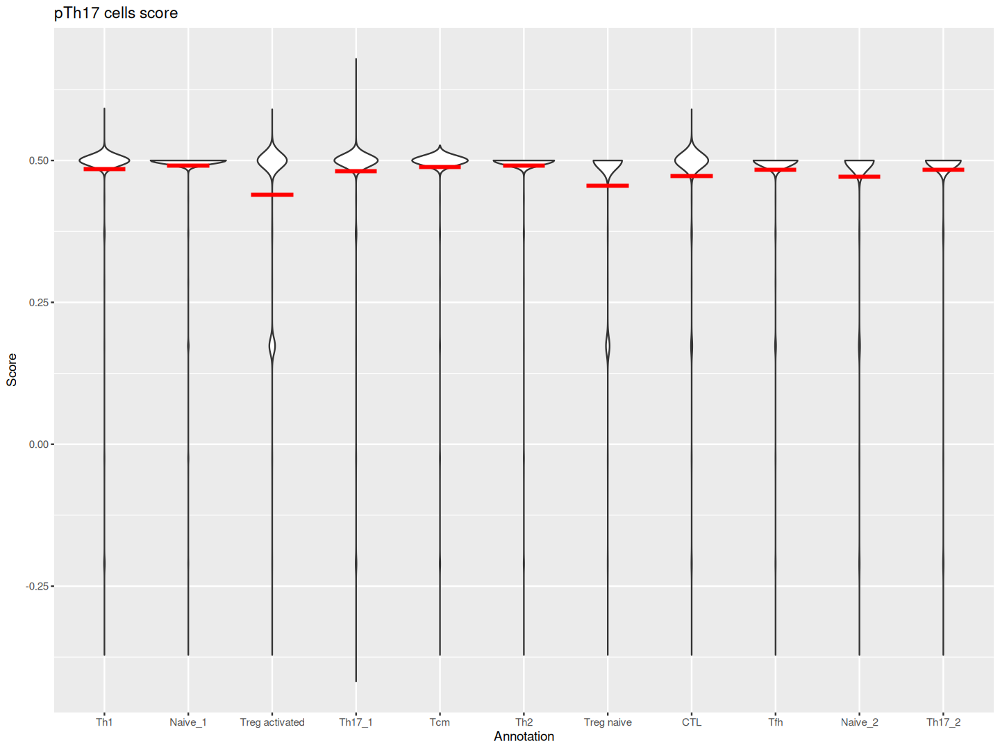

In [80]:
ggplot(data.frame(Score = pred2$scores[,5],
                  Annotation = gut_5p$annotations), aes(x = Annotation, y = Score)) +
  geom_violin() + 
  stat_summary(fun = "mean",
               geom = "crossbar", 
               width = 0.5,
               colour = "red") + ggtitle("pTh17 cells score")

# GSEA

## GSE141540

In [10]:
gset <- getGEO("GSE141540", GSEMatrix =TRUE, getGPL=TRUE, AnnotGPL=TRUE)

Found 1 file(s)

GSE141540_series_matrix.txt.gz

Using locally cached version: /home/vercanie/R/tmp//RtmpjgvyCo/GSE141540_series_matrix.txt.gz

Using locally cached version of GPL1261 found here:
/home/vercanie/R/tmp//RtmpjgvyCo/GPL1261.annot.gz 



In [14]:
str(gset$GSE141540_series_matrix.txt.gz)

Formal class 'ExpressionSet' [package "Biobase"] with 7 slots
  ..@ experimentData   :Formal class 'MIAME' [package "Biobase"] with 13 slots
  .. .. ..@ name             : chr "Maria,,Vila de Mucha"
  .. .. ..@ lab              : chr ""
  .. .. ..@ contact          : chr "regmila@ucl.ac.uk"
  .. .. ..@ title            : chr "Regulatory T cells restrain IL-2- and Blimp-1-dependent acquisition of cytotoxic function by CD4+ T cells"
  .. .. ..@ abstract         : chr "In addition to helper and regulatory potential, CD4+T cells also acquire cytotoxic activity marked by granzyme "| __truncated__
  .. .. ..@ url              : chr "https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE141540"
  .. .. ..@ pubMedIds        : chr "31924474"
  .. .. ..@ samples          : list()
  .. .. ..@ hybridizations   : list()
  .. .. ..@ normControls     : list()
  .. .. ..@ preprocessing    : list()
  .. .. ..@ other            :List of 22
  .. .. .. ..$ contact_address        : chr "72 Huntley Street"


In [15]:
gset$GSE141540_series_matrix.txt.gz$`cell type:ch1`

[1] "Foxp3GFP- CD4+ Trp-1 cells" "Foxp3GFP- CD4+ Trp-1 cells"
[3] "Foxp3GFP- CD4+ Trp-1 cells" "Foxp3GFP- CD4+ Trp-1 cells"
[5] "Foxp3GFP- CD4+ Trp-1 cells" "Foxp3GFP- CD4+ Trp-1 cells"
[7] "Foxp3GFP- CD4+ Trp-1 cells" "Foxp3GFP- CD4+ Trp-1 cells"
[9] "Foxp3GFP- CD4+ Trp-1 cells"

In [16]:
gset$GSE141540_series_matrix.txt.gz$`tissue:ch1`

[1] "tumour"               "tumour"               "tumour"              
[4] "tumour"               "tumour"               "tumour"              
[7] "draining Lymph nodes" "draining Lymph nodes" "draining Lymph nodes"

In [18]:
gset$GSE141540_series_matrix.txt.gz$

[1] "tissue: tumour"               "tissue: tumour"              
[3] "tissue: tumour"               "tissue: tumour"              
[5] "tissue: tumour"               "tissue: tumour"              
[7] "tissue: draining Lymph nodes" "tissue: draining Lymph nodes"
[9] "tissue: draining Lymph nodes"

In [13]:
gset$GSE237218_series_matrix.txt.gz$`disease status:ch1`

NULL

In [7]:
metadata <- data.frame(geo_id = gset$GSE237218_series_matrix.txt.gz$geo_accession,
                       disease = gset$GSE237218_series_matrix.txt.gz$`disease status:ch1`, 
                       cell_type = gset$GSE237218_series_matrix.txt.gz$`cell type:ch1`,
                      subject_id = gset$GSE237218_series_matrix.txt.gz$`subject id:ch1`,
                      sample_id = gset$GSE237218_series_matrix.txt.gz$description,
                      Age = gset$GSE237218_series_matrix.txt.gz$`age:ch1`,
                      Sex = gset$GSE237218_series_matrix.txt.gz$`Sex:ch1`
                      )



## GSE158703

In [2]:
gset <- getGEO("GSE158703", GSEMatrix =T, getGPL=TRUE, AnnotGPL=TRUE)

Found 1 file(s)

GSE158703_series_matrix.txt.gz

Annotation GPL not available, so will use submitter GPL instead



In [25]:
str(gset)

List of 1
 $ GSE158703_series_matrix.txt.gz:Formal class 'ExpressionSet' [package "Biobase"] with 7 slots
  .. ..@ experimentData   :Formal class 'MIAME' [package "Biobase"] with 13 slots
  .. .. .. ..@ name             : chr "Vijay,,Kuchroo"
  .. .. .. ..@ lab              : chr ""
  .. .. .. ..@ contact          : chr ""
  .. .. .. ..@ title            : chr "IL-27 driven transcriptional network identifies regulators of IL-10 expression across T helper cell subsets [IL"| __truncated__
  .. .. .. ..@ abstract         : chr "IL-27 is an immunoregulatory cytokine that suppresses inflammation through multiple mechanisms including induct"| __truncated__
  .. .. .. ..@ url              : chr "https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE158703"
  .. .. .. ..@ pubMedIds        : chr "33238123"
  .. .. .. ..@ samples          : list()
  .. .. .. ..@ hybridizations   : list()
  .. .. .. ..@ normControls     : list()
  .. .. .. ..@ preprocessing    : list()
  .. .. .. ..@ other       

In [26]:
gset$GSE158703_series_matrix.txt.gz$characteristics_ch1  %>% table

.
strain: C57BL/6 
             30 

In [27]:
gset$GSE158703_series_matrix.txt.gz$`characteristics_ch1.1`  %>% table

.
genotype: Foxp3-GFP; IL-10 Thy1.1 double reporter 
                                               30 

In [29]:
gset$GSE158703_series_matrix.txt.gz$growth_protocol_ch1  %>% table

.
naïve CD4+CD44-CD62L+GFP- cells were sorted from Foxp3-GFP; IL-10 -Thy1.1 double reporter mice using BD FACSAria sorter and were activated with irradiated splenocytes depleted of CD4 T cells (at the T: APC ratio of 1:6) and 2.5ug/ml soluble anti-CD3 in the presence of polarizing cytokines. Concentration of cytokines are as follows: 20ng/ml rmIL-12 (R & D systems) for Th1; 20ng/ml rmIL-4 (Miltenyi Biotec) for Th2; 2ng/ml of rhTGFb1 and 25ng/ml rmIL-6(both from Miltenyi Biotec) for non-pathogenic Th17; 20ng/ml rmIL-1β(Miltenyi Biotec), 25ng/ml rmIL-6 (Miltenyi Biotec), and 20ng/ml rmIL-23 (R & D systems) for pathogenic Th17; 25ng/ml of rmIL-27 (R & D systems) for Tr1. IL-10 positive (Thy1.1+) and negative (Thy1.1+) 7-AAD-TCRβ+CD4+GFP- cells were resorted at 72 hours. 
                                                                                                                                                                                                                             

In [31]:
gset$GSE158703_series_matrix.txt.gz$title  %>% table

.
pTh17_13neg pTh17_13pos pTh17_14neg pTh17_14pos pTh17_15neg pTh17_15pos 
          1           1           1           1           1           1 
   Th1_4neg    Th1_4pos    Th1_5neg    Th1_5pos    Th1_6neg    Th1_6pos 
          1           1           1           1           1           1 
 Th17_10neg  Th17_10pos  Th17_11neg  Th17_11pos  Th17_12neg  Th17_12pos 
          1           1           1           1           1           1 
   Th2_7neg    Th2_7pos    Th2_8neg    Th2_8pos    Th2_9neg    Th2_9pos 
          1           1           1           1           1           1 
  Tr1_16neg   Tr1_16pos   Tr1_17neg   Tr1_17pos   Tr1_18neg   Tr1_18pos 
          1           1           1           1           1           1 

In [3]:
metadata <- data.frame(geo_id = gset$GSE158703_series_matrix.txt.gz$geo_accession,
                       sample = gset$GSE158703_series_matrix.txt.gz$title
                      )

In [4]:
metadata  <- metadata  %>% separate(sample, into = c("population","sample_id"), sep = "_", remove = F)

In [5]:
metadata

geo_id,sample,population,sample_id
<chr>,<chr>,<chr>,<chr>
GSM4808362,Th1_4neg,Th1,4neg
GSM4808363,Th1_4pos,Th1,4pos
GSM4808364,Th1_5neg,Th1,5neg
GSM4808365,Th1_5pos,Th1,5pos
GSM4808366,Th1_6neg,Th1,6neg
GSM4808367,Th1_6pos,Th1,6pos
GSM4808368,Th2_7neg,Th2,7neg
GSM4808369,Th2_7pos,Th2,7pos
GSM4808370,Th2_8neg,Th2,8neg


In [6]:
expr <- exprs(gset$GSE158703_series_matrix.txt.gz)

In [41]:
expr

Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”


GSM4808362,GSM4808363,GSM4808364,GSM4808365,GSM4808366,GSM4808367,GSM4808368,GSM4808369,GSM4808370,GSM4808371,⋯,GSM4808382,GSM4808383,GSM4808384,GSM4808385,GSM4808386,GSM4808387,GSM4808388,GSM4808389,GSM4808390,GSM4808391


In [42]:
# ---- Settings ----
data_dir <- "data/published_data/GSE158703/"   # folder with the *.genes.results.txt.gz files
value_for_counts <- "expected_count"  # "expected_count" | "TPM" | "FPKM"
write_outputs <- TRUE

# ---- Packages ----
suppressPackageStartupMessages({
  library(data.table)
  library(stringr)
})

In [43]:
# ---- Helpers ----
# Make a clean sample name from the filename
# Example: GSM4808391_Tr1_18pos_RSEM_mm10_ucsc_genomestudio_genes.genes.results.txt.gz
#   -> Tr1_18pos (keeps GSM ID too as a prefix so names remain unique)
make_sample_name <- function(fn) {
  base <- basename(fn)
  # capture GSM id and the next token (cell type + replicate like Tr1_18pos)
  gsm  <- str_match(base, "^(GSM\\d+)")[,2]
  lab  <- str_match(base, "^GSM\\d+_([^_]+_[^_]+)")[,2]
  if (is.na(lab)) {
    # fallback: remove constant suffix
    lab <- str_replace(base, "_RSEM.*$", "")
    lab <- str_replace(lab, "^GSM\\d+_", "")
  }
  paste0(gsm, "_", lab)
}

# Read one RSEM genes.results file -> data.table(gene_id, value)
read_rsem_gene_table <- function(file, value_col = "expected_count") {
  dt <- fread(file, sep = "\t", header = TRUE, showProgress = FALSE)
  req_cols <- c("gene_id", "expected_count", "TPM", "FPKM")
  if (!all(c("gene_id", value_col) %in% names(dt))) {
    stop("File ", file, " does not have columns: gene_id and ", value_col,
         ". Available: ", paste(names(dt), collapse = ", "))
  }
  out <- dt[, .(gene_id, value = get(value_col))]
  # RSEM can put multiple transcripts under a gene; gene_id should be unique already.
  # If not, sum duplicates:
  out <- out[, .(value = sum(value, na.rm = TRUE)), by = gene_id]
  setnames(out, "value", make_sample_name(file))
  out[]
}

In [44]:
# ---- Collect files ----
files <- list.files(data_dir, pattern = "genes\\.genes\\.results\\.txt\\.gz$", full.names = TRUE)
if (length(files) == 0) {
  stop("No RSEM gene files found in: ", data_dir)
}

cat("Found", length(files), "files.\n")

# ---- Read & merge ----
value_col <- value_for_counts  # choose "expected_count", "TPM", or "FPKM"
lst <- lapply(files, read_rsem_gene_table, value_col = value_col)

# merge all by gene_id
mat_dt <- Reduce(function(x, y) merge(x, y, by = "gene_id", all = TRUE), lst)

# remove ERCC/summary rows if present (RSEM rarely uses __ prefixes, but just in case)
mat_dt <- mat_dt[!grepl("^(__|ERCC)", gene_id)]

# ---- Coerce to matrix ----
genes <- mat_dt$gene_id
m <- as.matrix(mat_dt[, -1])
storage.mode(m) <- "double"
rownames(m) <- genes

# ---- Tidy sample order (optional): keep as-is or sort by name
# m <- m[, order(colnames(m)), drop = FALSE]

# ---- Quick sanity checks ----
cat("Matrix dimensions:", paste(dim(m), collapse = " x "), "\n")
print(colnames(m))

Found 30 files.
Matrix dimensions: 23420 x 30 
 [1] "GSM4808362_Th1_4neg"    "GSM4808363_Th1_4pos"    "GSM4808364_Th1_5neg"   
 [4] "GSM4808365_Th1_5pos"    "GSM4808366_Th1_6neg"    "GSM4808367_Th1_6pos"   
 [7] "GSM4808368_Th2_7neg"    "GSM4808369_Th2_7pos"    "GSM4808370_Th2_8neg"   
[10] "GSM4808371_Th2_8pos"    "GSM4808372_Th2_9neg"    "GSM4808373_Th2_9pos"   
[13] "GSM4808374_Th17_10neg"  "GSM4808375_Th17_10pos"  "GSM4808376_Th17_11neg" 
[16] "GSM4808377_Th17_11pos"  "GSM4808378_Th17_12neg"  "GSM4808379_Th17_12pos" 
[19] "GSM4808380_pTh17_13neg" "GSM4808381_pTh17_13pos" "GSM4808382_pTh17_14neg"
[22] "GSM4808383_pTh17_14pos" "GSM4808384_pTh17_15neg" "GSM4808385_pTh17_15pos"
[25] "GSM4808386_Tr1_16neg"   "GSM4808387_Tr1_16pos"   "GSM4808388_Tr1_17neg"  
[28] "GSM4808389_Tr1_17pos"   "GSM4808390_Tr1_18neg"   "GSM4808391_Tr1_18pos"  


In [45]:
# ---- Optional: save outputs ----
if (write_outputs) {
  out_counts   <- file.path(data_dir, paste0("rsem_", value_col, "_matrix.tsv.gz"))
  fwrite(data.table(gene_id = rownames(m), m), out_counts, sep = "\t", quote = FALSE, compress = "gzip")
  cat("Wrote:", out_counts, "\n")
}

# ---- Optional: make an integer counts matrix for DESeq2 if using expected_count ----
if (identical(value_col, "expected_count")) {
  m_counts_int <- round(m)               # DESeq2 expects integers
  storage.mode(m_counts_int) <- "integer"
  if (write_outputs) {
    out_int <- file.path(data_dir, "rsem_expected_count_integer_matrix.tsv.gz")
    fwrite(data.table(gene_id = rownames(m_counts_int), m_counts_int),
           out_int, sep = "\t", quote = FALSE, compress = "gzip")
    cat("Wrote:", out_int, "\n")
  }
}

Wrote: data/published_data/GSE158703//rsem_expected_count_matrix.tsv.gz 
Wrote: data/published_data/GSE158703//rsem_expected_count_integer_matrix.tsv.gz 


In [5]:
mtx  <- fread("data/published_data/GSE158703//rsem_expected_count_integer_matrix.tsv.gz")

In [30]:
mtx 

gene_id,GSM4808362_Th1_4neg,GSM4808363_Th1_4pos,GSM4808364_Th1_5neg,GSM4808365_Th1_5pos,GSM4808366_Th1_6neg,GSM4808367_Th1_6pos,GSM4808368_Th2_7neg,GSM4808369_Th2_7pos,GSM4808370_Th2_8neg,⋯,GSM4808382_pTh17_14neg,GSM4808383_pTh17_14pos,GSM4808384_pTh17_15neg,GSM4808385_pTh17_15pos,GSM4808386_Tr1_16neg,GSM4808387_Tr1_16pos,GSM4808388_Tr1_17neg,GSM4808389_Tr1_17pos,GSM4808390_Tr1_18neg,GSM4808391_Tr1_18pos
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
0610005C13Rik,0,1,0,0,0,0,1,0,0,⋯,1,0,0,0,0,0,0,0,0,0
0610007N19Rik,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,2,0,0,0,5
0610007P14Rik,168,524,188,609,254,563,724,1113,735,⋯,387,477,489,505,92,113,102,139,139,110
0610008F07Rik,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0610009B14Rik,0,0,1,0,0,0,1,0,0,⋯,0,0,2,0,1,0,0,0,0,0
0610009B22Rik,38,73,47,79,53,88,112,117,112,⋯,38,46,48,60,32,16,28,30,33,45
0610009D07Rik,328,470,380,657,430,535,955,1112,876,⋯,374,389,561,351,270,280,276,329,368,300
0610009L18Rik,2,5,5,17,8,8,5,5,17,⋯,3,3,11,3,7,5,9,7,13,7
0610009O20Rik,163,211,171,237,235,229,413,423,340,⋯,171,215,203,158,157,145,157,149,217,122


In [6]:
df  <- mtx  %>% as.data.frame  %>% column_to_rownames("gene_id")

In [32]:
df

,GSM4808362_Th1_4neg,GSM4808363_Th1_4pos,GSM4808364_Th1_5neg,GSM4808365_Th1_5pos,GSM4808366_Th1_6neg,GSM4808367_Th1_6pos,GSM4808368_Th2_7neg,GSM4808369_Th2_7pos,GSM4808370_Th2_8neg,GSM4808371_Th2_8pos,⋯,GSM4808382_pTh17_14neg,GSM4808383_pTh17_14pos,GSM4808384_pTh17_15neg,GSM4808385_pTh17_15pos,GSM4808386_Tr1_16neg,GSM4808387_Tr1_16pos,GSM4808388_Tr1_17neg,GSM4808389_Tr1_17pos,GSM4808390_Tr1_18neg,GSM4808391_Tr1_18pos
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
0610005C13Rik,0,1,0,0,0,0,1,0,0,0,⋯,1,0,0,0,0,0,0,0,0,0
0610007N19Rik,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,2,0,0,0,5
0610007P14Rik,168,524,188,609,254,563,724,1113,735,1179,⋯,387,477,489,505,92,113,102,139,139,110
0610008F07Rik,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0610009B14Rik,0,0,1,0,0,0,1,0,0,3,⋯,0,0,2,0,1,0,0,0,0,0
0610009B22Rik,38,73,47,79,53,88,112,117,112,147,⋯,38,46,48,60,32,16,28,30,33,45
0610009D07Rik,328,470,380,657,430,535,955,1112,876,1199,⋯,374,389,561,351,270,280,276,329,368,300
0610009L18Rik,2,5,5,17,8,8,5,5,17,7,⋯,3,3,11,3,7,5,9,7,13,7
0610009O20Rik,163,211,171,237,235,229,413,423,340,463,⋯,171,215,203,158,157,145,157,149,217,122


In [7]:
metadata$gsm_sample  <- paste(metadata$geo_id, metadata$sample, sep = "_")

In [8]:
metadata$il10  <- ifelse(grepl(metadata$sample, pattern = "neg"), "neg","pos")

In [12]:
metadata

geo_id,sample,population,sample_id,gsm_sample,il10
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
GSM4808362,Th1_4neg,Th1,4neg,GSM4808362_Th1_4neg,neg
GSM4808363,Th1_4pos,Th1,4pos,GSM4808363_Th1_4pos,pos
GSM4808364,Th1_5neg,Th1,5neg,GSM4808364_Th1_5neg,neg
GSM4808365,Th1_5pos,Th1,5pos,GSM4808365_Th1_5pos,pos
GSM4808366,Th1_6neg,Th1,6neg,GSM4808366_Th1_6neg,neg
GSM4808367,Th1_6pos,Th1,6pos,GSM4808367_Th1_6pos,pos
GSM4808368,Th2_7neg,Th2,7neg,GSM4808368_Th2_7neg,neg
GSM4808369,Th2_7pos,Th2,7pos,GSM4808369_Th2_7pos,pos
GSM4808370,Th2_8neg,Th2,8neg,GSM4808370_Th2_8neg,neg


In [9]:
metadata$group  <- paste(metadata$population, metadata$il10) 

In [21]:
metadata

geo_id,sample,population,sample_id,gsm_sample,il10,group
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
GSM4808362,Th1_4neg,Th1,4neg,GSM4808362_Th1_4neg,neg,Th1 neg
GSM4808363,Th1_4pos,Th1,4pos,GSM4808363_Th1_4pos,pos,Th1 pos
GSM4808364,Th1_5neg,Th1,5neg,GSM4808364_Th1_5neg,neg,Th1 neg
GSM4808365,Th1_5pos,Th1,5pos,GSM4808365_Th1_5pos,pos,Th1 pos
GSM4808366,Th1_6neg,Th1,6neg,GSM4808366_Th1_6neg,neg,Th1 neg
GSM4808367,Th1_6pos,Th1,6pos,GSM4808367_Th1_6pos,pos,Th1 pos
GSM4808368,Th2_7neg,Th2,7neg,GSM4808368_Th2_7neg,neg,Th2 neg
GSM4808369,Th2_7pos,Th2,7pos,GSM4808369_Th2_7pos,pos,Th2 pos
GSM4808370,Th2_8neg,Th2,8neg,GSM4808370_Th2_8neg,neg,Th2 neg


In [21]:
plan("sequential")

In [8]:
gut_cdn <- readRDS("../241201_VN_PREDICT2/data/cdn/gut_5p_integrated_cd4_prolif_filt.rds")

In [15]:
counts_small  <- gut_cdn@assays$RNA@counts[,sample(1:ncol(gut_cdn@assays$RNA@counts), size = 6000)]

ERROR: Error in eval(expr, envir, enclos): object 'gut_cdn' not found


In [17]:
counts_small

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]



36601 x 6000 sparse Matrix of class "dgCMatrix"
                                                                                    
MIR1302-2HG  .        .        .        .        .        .        .        .       
FAM138A      .        .        .        .        .        .        .        .       
OR4F5        .        .        .        .        .        .        .        .       
AL627309.1   .        .        .        .        .        .        .        .       
AL627309.3   .        .        .        .        .        .        .        .       
AL627309.2   .        .        .        .        .        .        .        .       
AL627309.5   .        .        .        .        .        .        .        .       
AL627309.4   .        .        .        .        .        .        .        .       
AP006222.2   .        .        .        .        .        .        .        .       
AL732372.1   .        .        .        .        .        .        .        .       
OR4F29       .   

In [19]:
dir.create("data/gut_5p/")

In [20]:
saveRDS(counts_small, "data/gut_5p/gut_5p_cd4_subset6kcells.rds")

In [4]:
counts_small  <- readRDS("data/gut_5p/gut_5p_cd4_subset6kcells.rds")

In [11]:
counts_small

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]



36601 x 6000 sparse Matrix of class "dgCMatrix"
                                                                                    
MIR1302-2HG  .        .        .        .        .        .        .        .       
FAM138A      .        .        .        .        .        .        .        .       
OR4F5        .        .        .        .        .        .        .        .       
AL627309.1   .        .        .        .        .        .        .        .       
AL627309.3   .        .        .        .        .        .        .        .       
AL627309.2   .        .        .        .        .        .        .        .       
AL627309.5   .        .        .        .        .        .        .        .       
AL627309.4   .        .        .        .        .        .        .        .       
AP006222.2   .        .        .        .        .        .        .        .       
AL732372.1   .        .        .        .        .        .        .        .       
OR4F29       .   

In [15]:
ref_tr1 <- list(matrix = as.matrix(df), 
                       labels = metadata$group)


In [16]:
ref_tr1$matrix  <- as.matrix(df)

In [17]:
rownames(ref_tr1$matrix)  <- str_to_upper(rownames(ref_tr1$matrix))

In [18]:
counts_small  <- counts_small[rownames(counts_small) %in% rownames(ref_tr1$matrix),]

In [19]:
table(rownames(ref_tr1$matrix) %in% rownames(counts_small))


FALSE  TRUE 
 8320 15100 

In [20]:
counts_small

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]



15100 x 6000 sparse Matrix of class "dgCMatrix"
                                                                                  
SAMD11     .        .        .        .        .        .        .        .       
NOC2L      .        1.125027 .        .        1.265588 .        .        .       
KLHL17     .        .        .        .        .        .        .        .       
PLEKHN1    .        .        .        .        .        .        .        .       
ISG15      .        .        .        .        .        1.813331 .        .       
AGRN       .        .        .        .        .        .        .        .       
RNF223     .        .        .        .        .        .        .        .       
TTLL10     .        .        .        .        .        .        .        .       
TNFRSF18   .        .        .        .        .        .        1.601169 1.430470
TNFRSF4    .        .        .        .        .        2.421405 .        .       
SDF4       .        .        .        .

In [24]:
ref_tr1$labels

[1] "Th1 neg"   "Th1 pos"   "Th1 neg"   "Th1 pos"   "Th1 neg"   "Th1 pos"  
 [7] "Th2 neg"   "Th2 pos"   "Th2 neg"   "Th2 pos"   "Th2 neg"   "Th2 pos"  
[13] "Th17 neg"  "Th17 pos"  "Th17 neg"  "Th17 pos"  "Th17 neg"  "Th17 pos" 
[19] "pTh17 neg" "pTh17 pos" "pTh17 neg" "pTh17 pos" "pTh17 neg" "pTh17 pos"
[25] "Tr1 neg"   "Tr1 pos"   "Tr1 neg"   "Tr1 pos"   "Tr1 neg"   "Tr1 pos"

In [34]:
ref_tr1$matrix 

,GSM4808362_Th1_4neg,GSM4808363_Th1_4pos,GSM4808364_Th1_5neg,GSM4808365_Th1_5pos,GSM4808366_Th1_6neg,GSM4808367_Th1_6pos,GSM4808368_Th2_7neg,GSM4808369_Th2_7pos,GSM4808370_Th2_8neg,GSM4808371_Th2_8pos,⋯,GSM4808382_pTh17_14neg,GSM4808383_pTh17_14pos,GSM4808384_pTh17_15neg,GSM4808385_pTh17_15pos,GSM4808386_Tr1_16neg,GSM4808387_Tr1_16pos,GSM4808388_Tr1_17neg,GSM4808389_Tr1_17pos,GSM4808390_Tr1_18neg,GSM4808391_Tr1_18pos
0610005C13Rik,0,1,0,0,0,0,1,0,0,0,⋯,1,0,0,0,0,0,0,0,0,0
0610007N19Rik,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,2,0,0,0,5
0610007P14Rik,168,524,188,609,254,563,724,1113,735,1179,⋯,387,477,489,505,92,113,102,139,139,110
0610008F07Rik,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0610009B14Rik,0,0,1,0,0,0,1,0,0,3,⋯,0,0,2,0,1,0,0,0,0,0
0610009B22Rik,38,73,47,79,53,88,112,117,112,147,⋯,38,46,48,60,32,16,28,30,33,45
0610009D07Rik,328,470,380,657,430,535,955,1112,876,1199,⋯,374,389,561,351,270,280,276,329,368,300
0610009L18Rik,2,5,5,17,8,8,5,5,17,7,⋯,3,3,11,3,7,5,9,7,13,7
0610009O20Rik,163,211,171,237,235,229,413,423,340,463,⋯,171,215,203,158,157,145,157,149,217,122
0610010B08Rik,87,63,46,139,111,113,112,117,86,97,⋯,78,124,77,119,114,71,133,128,130,125


In [35]:
counts_small

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘ACGTCAACATCGGAAG-1_1542425_1_1_1’, ‘TCTCTAACATGCCTTC-1_1542395_1_1_1’, ‘CAAGGCCGTTACGTCA-1_1193500_1_1_1’ ... ]]



36601 x 6000 sparse Matrix of class "dgCMatrix"
                                                                                    
MIR1302-2HG  .        .        .        .        .        .        .        .       
FAM138A      .        .        .        .        .        .        .        .       
OR4F5        .        .        .        .        .        .        .        .       
AL627309.1   .        .        .        .        .        .        .        .       
AL627309.3   .        .        .        .        .        .        .        .       
AL627309.2   .        .        .        .        .        .        .        .       
AL627309.5   .        .        .        .        .        .        .        .       
AL627309.4   .        .        .        .        .        .        .        .       
AP006222.2   .        .        .        .        .        .        .        .       
AL732372.1   .        .        .        .        .        .        .        .       
OR4F29       .   

In [21]:
rownames(counts_small)

[1] "SAMD11"     "NOC2L"      "KLHL17"     "PLEKHN1"    "ISG15"     
    [6] "AGRN"       "RNF223"     "TTLL10"     "TNFRSF18"   "TNFRSF4"   
   [11] "SDF4"       "B3GALT6"    "UBE2J2"     "ACAP3"      "PUSL1"     
   [16] "TAS1R3"     "DVL1"       "MXRA8"      "AURKAIP1"   "CCNL2"     
   [21] "MRPL20"     "TMEM88B"    "VWA1"       "ATAD3A"     "TMEM240"   
   [26] "SSU72"      "MIB2"       "CDK11B"     "NADK"       "GNB1"      
   [31] "TMEM52"     "GABRD"      "PRKCZ"      "SKI"        "MORN1"     
   [36] "RER1"       "PEX10"      "PLCH2"      "PANK4"      "HES5"      
   [41] "TNFRSF14"   "MMEL1"      "TTC34"      "ACTRT2"     "PRDM16"    
   [46] "ARHGEF16"   "MEGF6"      "CCDC27"     "SMIM1"      "LRRC47"    
   [51] "CEP104"     "DFFB"       "AJAP1"      "NPHP4"      "KCNAB2"    
   [56] "CHD5"       "RPL22"      "RNF207"     "ICMT"       "HES3"      
   [61] "GPR153"     "ACOT7"      "HES2"       "ESPN"       "TNFRSF25"  
   [66] "PLEKHG5"    "NOL9"       "TAS1R1"     "ZBTB48"     "KLHL21"    
   [71] "PHF13"      "THAP3"      "DNAJC11"    "CAMTA1"     "VAMP3"     
   [76] "PER3"       "UTS2"       "TNFRSF9"    "PARK7"      "ERRFI1"    
   [81] "SLC45A1"    "RERE"       "ENO1"       "SLC2A7"     "SLC2A5"    
   [86] "GPR157"     "H6PD"       "SPSB1"      "SLC25A33"   "TMEM201"   
   [91] "PIK3CD"     "CLSTN1"     "CTNNBIP1"   "LZIC"       "NMNAT1"    
   [96] "RBP7"       "UBE4B"      "KIF1B"      "PGD"        "CORT"      
  [101] "DFFA"       "PEX14"      "CASZ1"      "TARDBP"     "MASP2"     
  [106] "SRM"        "EXOSC10"    "MTOR"       "ANGPTL7"    "UBIAD1"    
  [111] "FBXO2"      "FBXO44"     "FBXO6"      "MAD2L2"     "DRAXIN"    
  [116] "AGTRAP"     "MTHFR"      "CLCN6"      "NPPA"       "NPPB"      
  [121] "PLOD1"      "MFN2"       "MIIP"       "TNFRSF8"    "TNFRSF1B"  
  [126] "VPS13D"     "DHRS3"      "AADACL3"    "PRAMEF12"   "PRAMEF6"   
  [131] "PRAMEF8"    "PRAMEF17"   "LRRC38"     "PDPN"       "PRDM2"     
  [136] "KAZN"       "TMEM51"     "FHAD1"      "EFHD2"      "CTRC"      
  [141] "CELA2A"     "CASP9"      "DNAJC16"    "AGMAT"      "DDI2"      
  [146] "RSC1A1"     "PLEKHM2"    "SLC25A34"   "TMEM82"     "FBLIM1"    
  [151] "SPEN"       "ZBTB17"     "HSPB7"      "CLCNKA"     "CLCNKB"    
  [156] "FAM131C"    "EPHA2"      "ARHGEF19"   "FBXO42"     "SZRD1"     
  [161] "SPATA21"    "NECAP2"     "CROCC"      "MFAP2"      "ATP13A2"   
  [166] "SDHB"       "PADI2"      "PADI1"      "PADI3"      "PADI4"     
  [171] "PADI6"      "RCC2"       "ARHGEF10L"  "IGSF21"     "KLHDC7A"   
  [176] "PAX7"       "TAS1R2"     "ALDH4A1"    "IFFO2"      "UBR4"      
  [181] "EMC1"       "MRTO4"      "CAPZB"      "NBL1"       "HTR6"      
  [186] "TMCO4"      "RNF186"     "OTUD3"      "PLA2G2E"    "PLA2G2A"   
  [191] "PLA2G5"     "PLA2G2D"    "PLA2G2F"    "PLA2G2C"    "UBXN10"    
  [196] "VWA5B1"     "CAMK2N1"    "MUL1"       "FAM43B"     "CDA"       
  [201] "PINK1"      "DDOST"      "KIF17"      "SH2D5"      "HP1BP3"    
  [206] "EIF4G3"     "ECE1"       "ALPL"       "RAP1GAP"    "USP48"     
  [211] "LDLRAD2"    "HSPG2"      "CELA3B"     "CDC42"      "WNT4"      
  [216] "ZBTB40"     "EPHA8"      "C1QA"       "C1QC"       "C1QB"      
  [221] "EPHB2"      "LACTBL1"    "KDM1A"      "LUZP1"      "HTR1D"     
  [226] "HNRNPR"     "TCEA3"      "ASAP3"      "E2F2"       "ID3"       
  [231] "RPL11"      "PITHD1"     "LYPLA2"     "GALE"       "HMGCL"     
  [236] "FUCA1"      "CNR2"       "PNRC2"      "SRSF10"     "MYOM3"     
  [241] "IL22RA1"    "IFNLR1"     "GRHL3"      "STPG1"      "NIPAL3"    
  [246] "RCAN3"      "NCMAP"      "SRRM1"      "CLIC4"      "RUNX3"     
  [251] "SYF2"       "RHD"        "TMEM50A"    "LDLRAP1"    "MAN1C1"    
  [256] "MTFR1L"     "PAQR7"      "STMN1"      "PAFAH2"     "EXTL1"     
  [261] "SLC30A2"    "TRIM63"     "PDIK1L"     "CNKSR1"     "CATSPER4"  
  [266] "CEP85"      "SH3BGRL3"   "UBXN11"     "CD52"       "LIN28A"    
  [271] "DHDDS"      "HMGN2"      "RPS6KA1"    "ARID1A"     "P

In [42]:
table(rownames(ref_tr1$matrix) %in% rownames(counts_small))


FALSE  TRUE 
 8320 15100 

In [22]:
ref_tr1$matrix  <- ref_tr1$matrix[rownames(ref_tr1$matrix) %in% rownames(counts_small),]

In [3]:
ref_tr1$matrix

,GSM4808362_Th1_4neg,GSM4808363_Th1_4pos,GSM4808364_Th1_5neg,GSM4808365_Th1_5pos,GSM4808366_Th1_6neg,GSM4808367_Th1_6pos,GSM4808368_Th2_7neg,GSM4808369_Th2_7pos,GSM4808370_Th2_8neg,GSM4808371_Th2_8pos,⋯,GSM4808382_pTh17_14neg,GSM4808383_pTh17_14pos,GSM4808384_pTh17_15neg,GSM4808385_pTh17_15pos,GSM4808386_Tr1_16neg,GSM4808387_Tr1_16pos,GSM4808388_Tr1_17neg,GSM4808389_Tr1_17pos,GSM4808390_Tr1_18neg,GSM4808391_Tr1_18pos
A1BG,1,0,0,2,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
A1CF,1,5,0,1,0,1,0,0,1,0,⋯,1,0,4,1,3,0,2,4,1,2
A2M,0,0,0,0,0,0,2,0,3,1,⋯,0,1,0,0,0,0,0,0,0,0
A3GALT2,6,6,5,1,5,2,10,0,3,2,⋯,15,2,4,4,6,8,5,0,6,0
A4GALT,2,1,0,3,2,0,0,0,1,0,⋯,2,3,0,6,1,0,0,0,1,5
A4GNT,0,0,1,1,1,0,0,1,1,1,⋯,0,0,2,1,0,1,1,1,0,0
AAAS,196,269,218,384,230,350,778,1088,738,1018,⋯,320,513,439,505,129,125,162,198,216,159
AACS,260,592,289,724,343,700,953,1238,1008,1306,⋯,639,646,795,636,119,130,108,154,129,114
AADAC,0,1,0,0,0,1,0,0,0,0,⋯,0,0,0,0,0,0,0,4,0,0
AADACL2,2,1,2,1,2,0,0,1,0,1,⋯,2,1,0,1,0,2,0,0,0,1


In [25]:
saveRDS(ref_tr1, "data/published_data/GSE158703/processed_refGSE158703.rds")

In [1]:
ref_tr1  <- readRDS("data/published_data/GSE158703/processed_refGSE158703.rds")

In [2]:
ref_tr1

In [6]:
pred <- SingleR(test = counts_small, 
                ref=ref_tr1$matrix, labels=ref_tr1$labels, 
                fine.tune = F,num.threads = 1
       )

In [7]:
pred

DataFrame with 6000 rows and 4 columns
                                                                    scores
                                                                  <matrix>
ACGTCAACATCGGAAG-1_1542425_1_1_1            0.493032:0.473408:0.487006:...
TCTCTAACATGCCTTC-1_1542395_1_1_1            0.487127:0.449670:0.506088:...
CAAGGCCGTTACGTCA-1_1193500_1_1_1            0.451463:0.436628:0.462676:...
GCAGTTAGTATCAGTC-1_003-043_T0_ILE_LP_5p_GEX 0.486062:0.463415:0.515032:...
TGGGCGTAGAGCCTAG-1_1271091_1_1_1            0.474407:0.449465:0.488302:...
...                                                                    ...
CTGTGCTAGGGAGTAA-1_1271083_1_1_1            0.479357:0.458504:0.488486:...
CCTTTCTCATATGGTC-1_1193511_1_1_1            0.428014:0.408223:0.455646:...
TTTGGTTTCAGTGTTG-1_1193607_1_1_1            0.445713:0.429184:0.448054:...
ACGAGCCGTCTGCGGT-1_HE012_T0_ILE_LP_5p_GEX   0.448007:0.433428:0.434631:...
ACACCAACATCGACGC-1_1737896_1_1_1            0.436220:0.427361

Add labels to the Seurat object. 

In [11]:
md_pred  <- data.frame(barcode = colnames(gut_cdn))

Loading required namespace: SeuratObject



In [12]:
md_pred

barcode
<chr>
AAACCTGAGAGCCTAG-1_1193610_1_1_1
AAACCTGCAGTCACTA-1_1193610_1_1_1
AAACCTGCATCGGACC-1_1193610_1_1_1
AAACCTGTCGCCAGCA-1_1193610_1_1_1
AAACCTGTCGCGATCG-1_1193610_1_1_1
AAACCTGTCTTCGGTC-1_1193610_1_1_1
AAACGGGAGCGTTTAC-1_1193610_1_1_1
AAACGGGCACAGACTT-1_1193610_1_1_1
AAACGGGCAGGTGCCT-1_1193610_1_1_1


In [15]:
pred_df  <- as.data.frame(pred)

In [17]:
pred_df$barcode  <- rownames(pred)

In [18]:
pred_df

,scores.pTh17.neg,scores.pTh17.pos,scores.Th1.neg,scores.Th1.pos,scores.Th17.neg,scores.Th17.pos,scores.Th2.neg,scores.Th2.pos,scores.Tr1.neg,scores.Tr1.pos,labels,delta.next,pruned.labels,barcode
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<chr>
ACGTCAACATCGGAAG-1_1542425_1_1_1,0.4930319,0.4734083,0.4870064,0.4554950,0.4398711,0.4366371,0.4652341,0.4537773,0.4653298,0.4706881,pTh17 neg,6.025516e-03,pTh17 neg,ACGTCAACATCGGAAG-1_1542425_1_1_1
TCTCTAACATGCCTTC-1_1542395_1_1_1,0.4871266,0.4496700,0.5060882,0.4301891,0.4920248,0.4728605,0.4720556,0.4313196,0.5060436,0.4894493,Th1 neg,4.459921e-05,Th1 neg,TCTCTAACATGCCTTC-1_1542395_1_1_1
CAAGGCCGTTACGTCA-1_1193500_1_1_1,0.4514629,0.4366281,0.4626757,0.4389687,0.4208693,0.4208646,0.4279245,0.4150911,0.4359911,0.4381128,Th1 neg,1.121286e-02,Th1 neg,CAAGGCCGTTACGTCA-1_1193500_1_1_1
GCAGTTAGTATCAGTC-1_003-043_T0_ILE_LP_5p_GEX,0.4860620,0.4634151,0.5150320,0.4741977,0.4651352,0.4443758,0.4685268,0.4543255,0.4974899,0.5052692,Th1 neg,9.762824e-03,Th1 neg,GCAGTTAGTATCAGTC-1_003-043_T0_ILE_LP_5p_GEX
TGGGCGTAGAGCCTAG-1_1271091_1_1_1,0.4744069,0.4494653,0.4883024,0.4232309,0.4562598,0.4549812,0.4664579,0.4364852,0.4895840,0.4729301,Tr1 neg,1.281607e-03,Tr1 neg,TGGGCGTAGAGCCTAG-1_1271091_1_1_1
CTTACCGGTGACGCCT-1_HE023_T0_ILE_LP_5p_GEX,0.4134046,0.3975760,0.4278922,0.3884790,0.3901479,0.3700100,0.3902551,0.3735683,0.4264138,0.4170490,Th1 neg,1.478380e-03,Th1 neg,CTTACCGGTGACGCCT-1_HE023_T0_ILE_LP_5p_GEX
CCTACACAGGTGACCA-1_HE026_T0_COL_LP_5p_GEX,0.4532420,0.4318129,0.4481438,0.4162577,0.4241923,0.4303401,0.4461309,0.4311252,0.4308767,0.4381526,pTh17 neg,5.098185e-03,pTh17 neg,CCTACACAGGTGACCA-1_HE026_T0_COL_LP_5p_GEX
AAAGATGGTGACGGTA-1_1271048_1_1_1,0.4980313,0.4828507,0.5036310,0.4759024,0.4773555,0.4837410,0.4893091,0.4821369,0.4827713,0.4992526,Th1 neg,4.378354e-03,Th1 neg,AAAGATGGTGACGGTA-1_1271048_1_1_1
GCATGCGAGAGCTTCT-1_HE011_T0_ILE_LP_5p_GEX,0.4277452,0.4138050,0.4169220,0.3769430,0.3817909,0.3838818,0.4068049,0.3931565,0.3979389,0.4009033,pTh17 neg,1.082318e-02,pTh17 neg,GCATGCGAGAGCTTCT-1_HE011_T0_ILE_LP_5p_GEX


In [20]:
library(dplyr)


Attaching package: ‘dplyr’


The following object is masked from ‘package:Biobase’:

    combine


The following objects are masked from ‘package:GenomicRanges’:

    intersect, setdiff, union


The following object is masked from ‘package:GenomeInfoDb’:

    intersect


The following objects are masked from ‘package:IRanges’:

    collapse, desc, intersect, setdiff, slice, union


The following objects are masked from ‘package:S4Vectors’:

    first, intersect, rename, setdiff, setequal, union


The following objects are masked from ‘package:BiocGenerics’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:matrixStats’:

    count


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [21]:
md_pred  <- left_join(md_pred, pred_df)

Joining with `by = join_by(barcode)`


In [24]:
gut_cdn$singler  <- md_pred$labels

In [25]:
library(Seurat)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘sp’


The following object is masked from ‘package:IRanges’:

    %over%


‘SeuratObject’ was built under R 4.4.0 but the current version is
4.5.1; it is recomended that you reinstall ‘SeuratObject’ as the ABI
for R may have changed

‘SeuratObject’ was built with package ‘Matrix’ 1.7.0 but the current
version is 1.7.4; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:SummarizedExperiment’:

    Assays


The following object is masked from ‘package:GenomicRanges’:

    intersect


The following object is masked from ‘package:GenomeInfoDb’:

    intersect


The following object is masked from ‘package:IRanges’:

    intersect


The following object is masked from ‘package:S4Vectors’:

    intersect


The following object is masked from ‘package:BiocGenerics’:

    intersect


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



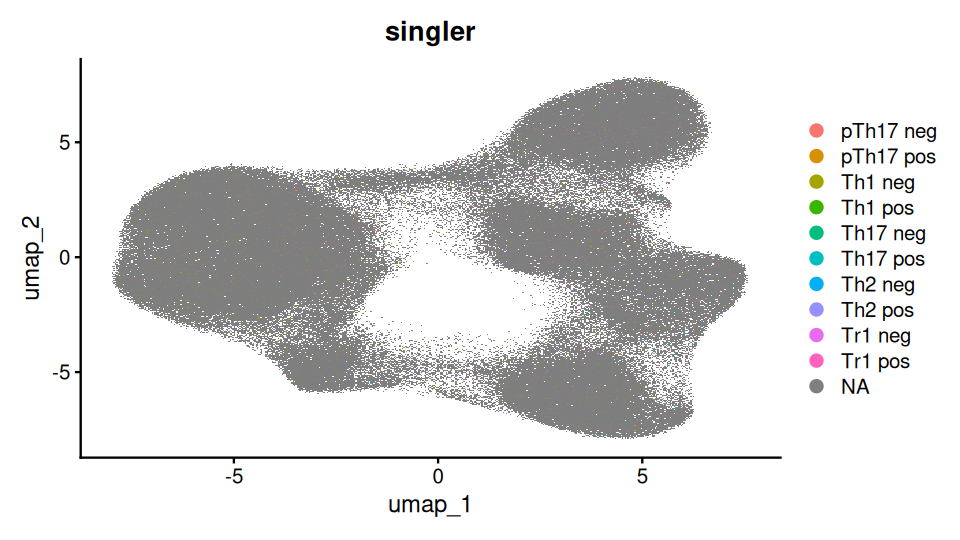

In [26]:
options(repr.plot.width = 8, repr.plot.height = 4.5)
DimPlot(gut_cdn, group.by = "singler")

In [27]:
gut_cdn$barcode  <- colnames(gut_cdn)

In [29]:
gut_cdn_small  <- subset(gut_cdn, barcode %in% rownames(pred))

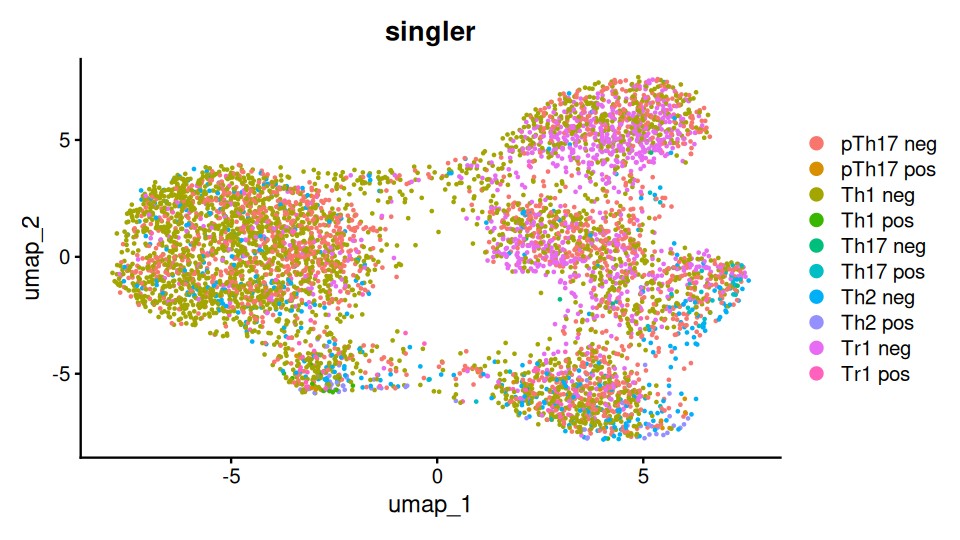

In [30]:

DimPlot(gut_cdn_small, group.by = "singler")

In [19]:
ls()

[1] "counts_small" "df"           "ggtheme"      "gset"         "metadata"    
[6] "mtx"

In [31]:
counts  <- gut_cdn@assays$RNA@counts

In [32]:
counts

  [[ suppressing 32 column names ‘AAACCTGAGAGCCTAG-1_1193610_1_1_1’, ‘AAACCTGCAGTCACTA-1_1193610_1_1_1’, ‘AAACCTGCATCGGACC-1_1193610_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘AAACCTGAGAGCCTAG-1_1193610_1_1_1’, ‘AAACCTGCAGTCACTA-1_1193610_1_1_1’, ‘AAACCTGCATCGGACC-1_1193610_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘AAACCTGAGAGCCTAG-1_1193610_1_1_1’, ‘AAACCTGCAGTCACTA-1_1193610_1_1_1’, ‘AAACCTGCATCGGACC-1_1193610_1_1_1’ ... ]]



36601 x 346456 sparse Matrix of class "dgCMatrix"
                                                                                    
MIR1302-2HG  .        .        .        .        .        .        .        .       
FAM138A      .        .        .        .        .        .        .        .       
OR4F5        .        .        .        .        .        .        .        .       
AL627309.1   .        .        .        .        .        .        .        .       
AL627309.3   .        .        .        .        .        .        .        .       
AL627309.2   .        .        .        .        .        .        .        .       
AL627309.5   .        .        .        .        .        .        .        .       
AL627309.4   .        .        .        .        .        .        .        .       
AP006222.2   .        .        .        .        .        .        .        .       
AL732372.1   .        .        .        .        .        .        .        .       
OR4F29       . 

In [33]:
counts  <- counts[rownames(counts) %in% rownames(ref_tr1$matrix),]

In [34]:
counts

  [[ suppressing 32 column names ‘AAACCTGAGAGCCTAG-1_1193610_1_1_1’, ‘AAACCTGCAGTCACTA-1_1193610_1_1_1’, ‘AAACCTGCATCGGACC-1_1193610_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘AAACCTGAGAGCCTAG-1_1193610_1_1_1’, ‘AAACCTGCAGTCACTA-1_1193610_1_1_1’, ‘AAACCTGCATCGGACC-1_1193610_1_1_1’ ... ]]

  [[ suppressing 32 column names ‘AAACCTGAGAGCCTAG-1_1193610_1_1_1’, ‘AAACCTGCAGTCACTA-1_1193610_1_1_1’, ‘AAACCTGCATCGGACC-1_1193610_1_1_1’ ... ]]



15100 x 346456 sparse Matrix of class "dgCMatrix"
                                                                                  
SAMD11     .        .        .        .        .        .        .        .       
NOC2L      .        .        2.596922 .        .        .        .        .       
KLHL17     .        .        .        .        .        .        .        .       
PLEKHN1    .        .        .        .        .        .        .        .       
ISG15      .        .        .        .        .        .        .        .       
AGRN       .        .        .        .        .        .        .        .       
RNF223     .        .        .        .        .        .        .        .       
TTLL10     .        .        .        .        .        .        .        .       
TNFRSF18   .        .        .        .        .        .        .        .       
TNFRSF4    .        .        .        .        .        .        .        .       
SDF4       1.097015 1.305719 .       

In [35]:
pred2 <- SingleR(test = counts, 
                ref=ref_tr1$matrix, labels=ref_tr1$labels, 
                fine.tune = F,num.threads = 1
       )

In [37]:
gut_cdn$singler  <- pred2$labels

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



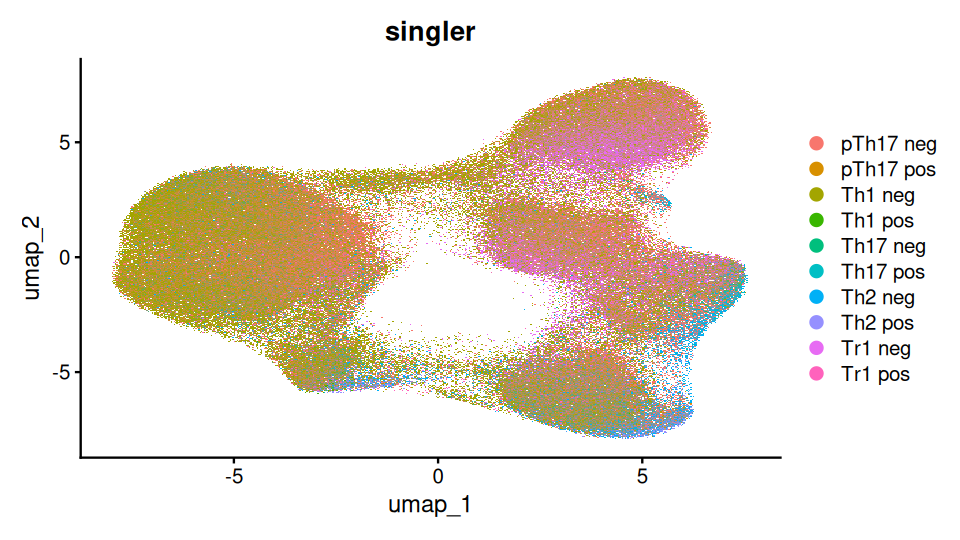

In [39]:
DimPlot(gut_cdn, group.by = "singler")

In [46]:
which(colnames(pred2$scores)=="Tr1 neg")


[1] 9

In [51]:
df_scores  <- as.data.frame(pred2$scores)

In [52]:
df_scores

pTh17 neg,pTh17 pos,Th1 neg,Th1 pos,Th17 neg,Th17 pos,Th2 neg,Th2 pos,Tr1 neg,Tr1 pos
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.4737931,0.4467430,0.4746656,0.4051213,0.4550584,0.4511488,0.4566083,0.4198135,0.4781304,0.4688620
0.4506366,0.4322870,0.4623129,0.4041910,0.4535098,0.4466484,0.4372215,0.4151424,0.4636128,0.4521798
0.4058603,0.3852698,0.4085862,0.3531861,0.4026355,0.3931845,0.4002390,0.3742561,0.4200445,0.4085921
0.4685661,0.4464128,0.4843104,0.4309445,0.4576355,0.4420297,0.4528081,0.4311894,0.4749360,0.4643893
0.4570865,0.4250748,0.4781859,0.4071795,0.4683020,0.4497524,0.4282494,0.3939788,0.4752626,0.4585678
0.4506508,0.4278520,0.4573285,0.3959996,0.4354476,0.4248333,0.4266430,0.3982468,0.4609651,0.4408208
0.4285591,0.4070875,0.4246113,0.3784470,0.4032961,0.3979316,0.4158262,0.3978270,0.4159062,0.4038322
0.4425687,0.4176093,0.4536979,0.4013327,0.4409263,0.4279540,0.4253513,0.4003783,0.4579173,0.4316252
0.3985663,0.3732822,0.4024022,0.3441929,0.3822985,0.3686151,0.3708258,0.3504892,0.4060899,0.3911951


In [53]:
gut_cdn$tr1_neg  <- df_scores$`Tr1 neg`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



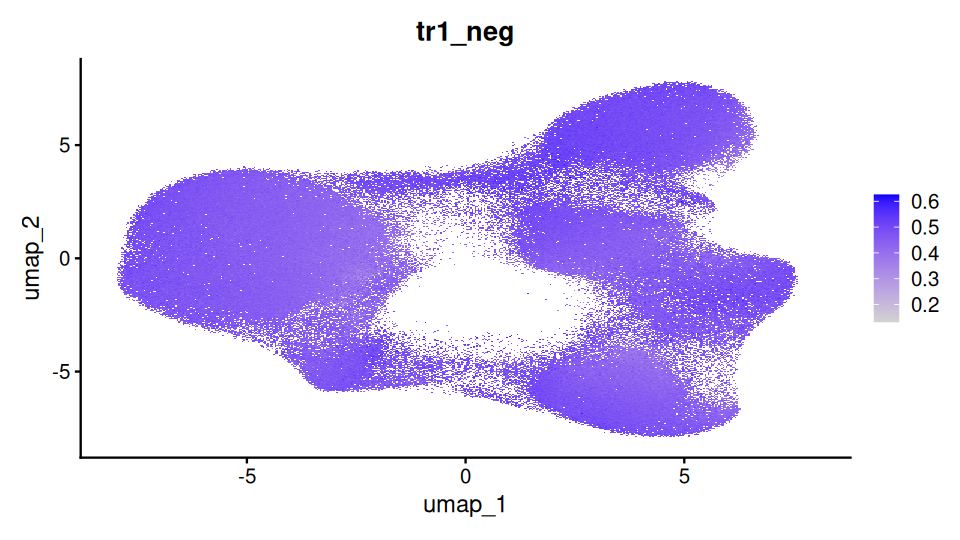

In [55]:
FeaturePlot(gut_cdn, features = "tr1_neg", min.cutoff = 0)

## GSE139990

## GSE268301